NetID: leahnl2

Assignment: Lab 4

Grade: _ / 12

Comments:

# CS448 - Lab 4: 3D Audio


In this lab we will learn how to create 3D sounds for headphone playback. We will make use of simple filters and HRTFs to create static and moving sources. Use the three sounds fly.wav, helicopter.wav, and crumble.wav in the lab archive as sources for the 3D recording that you will create.

## Part 1: Static sources using ITD/ILD cues

Assume the following source locations: 

- Straight ahead

- 45 degrees to the left

- 80 degrees to the right

- 160 degrees to the left

For each location find the source’s delay between the two ears (assume a source distance of 2 meters), and design two filters that will simulate that ITD and ILD features (round the IDT delays to an integer sample size). Assume that when sounds come from the side of the head the attenuation at the contralateral ear is by a factor of 0.7. From sounds coming medial plane (between the ears) there will be no attenuation due to the head. For positions moving from the medial plane towards the sides you can interpolate between no attenuation and a factor of 0.7. Design and plot the filters that correspond to the locations shown above and use them to make 3D sounds with the following sounds:

- Crumbling paper: [https://drive.google.com/uc?export=download&id=1bsZArYwMftsuCLdMknRomz4kAJWT-Uhv ]

- Fly: [https://drive.google.com/uc?export=download&id=1bswUsI28yJOUQuNLvNxq3pu9qj0bb8ne ]

- Helicopter: [https://drive.google.com/uc?export=download&id=1c8YhNNLmaO7CA2dJNCkBsB9MY0HjHDRL ]

Listen to the result through headphones and verify that they sound somewhat localized (it won’t sound perfect, but it should be believable).  ⚠️ **There is no need to render all three sounds, since the notebook will become very large and hard to upload.  At submission time just render one sound, but make sure that you listen to all three and that they sound good.** ⚠️

In [4]:
import numpy as np
import matplotlib.pyplot as plt
import scipy
import utils

In [85]:
def plot_filter_delay(left_delay, right_delay, samples, theta):
    plt.figure(figsize=(10, 2.5))
    plt.suptitle(f"ITD Delays for Angle = {theta}°")

    plt.subplot(1, 2, 1)
    left_filter_delay = np.zeros(samples)
    left_filter_delay[left_delay] = 1
    plt.stem(np.arange(samples), left_filter_delay, linefmt='c-', markerfmt='o', basefmt=" ")
    plt.title("Left ear")
    plt.xlabel("Time (samples)")
    plt.ylabel("Filter Magnitude")

    plt.subplot(1, 2, 2)
    right_filter_delay = np.zeros(samples)
    right_filter_delay[right_delay] = 1
    plt.stem(np.arange(samples), right_filter_delay, linefmt='purple', markerfmt='o', basefmt=" ")
    plt.title("Right ear")
    plt.xlabel("Time (samples)")
    plt.ylabel("Filter Magnitude")

    plt.tight_layout()
    plt.show()

def sinc_interp(input_x, sample_rate, itd_samples, epsilon):
    filter_delay = np.zeros(itd_samples + 1)
    filter_delay[-1] = 1
    delayed = scipy.signal.lfilter(filter_delay, 1, input_x)
    sinc = np.sinc(2 * np.pi * sample_rate * np.linspace(0, epsilon, num=128))   
    return scipy.signal.lfilter(sinc, 1, delayed)

def simulate_source_delay(input_x, sample_rate, theta):
    # check for base case where no delay is necessary
    if theta == 0:
        plot_filter_delay(0, 0, 300, theta)
        return np.stack((input_x, input_x), axis=0)
        
    d_head = 0.15         # average distance (in m) between ears
    d_source = 2          # in m
    speed_of_light = 343  # in m/s

    # calculate ITD as a delay using distance from source based on theta
    d_vert = d_source * np.cos(theta * (np.pi / 180))
    d_horiz = d_source * np.sin(theta * (np.pi / 180))
    itd_left = np.sqrt((d_head/2 + d_horiz)**2 + (d_vert)**2) / speed_of_light
    itd_right = np.sqrt((d_head/2 - d_horiz)**2 + (d_vert)**2) / speed_of_light
    itd_samples_left = int(itd_left * sample_rate)
    itd_samples_right = int(itd_right * sample_rate)
    
    # calculate epsilon based on 
    epsilon_left = abs((itd_left * sample_rate) - itd_samples_left)
    epsilon_right = abs((itd_right * sample_rate) - itd_samples_right)

    # apply sinc interpolation to shift the channels
    left_channel = sinc_interp(input_x, sample_rate, itd_samples_left, epsilon_left)
    right_channel = sinc_interp(input_x, sample_rate, itd_samples_right, epsilon_right)

    # plot the filters for both channels
    plot_filter_delay(itd_samples_left, itd_samples_right, 300, theta)
    
    # interpolate the gain between no attenuation (mediaL) and a factor of 0.7 (side) 
    ild = 0.7 * np.abs(np.sin(theta * (np.pi / 180)))

    # apply ILD gain to the contralateral ear
    if theta < 0:
        right_channel *= ild # sound is to the left, attenuate right channel
    elif theta > 0:
        left_channel *= ild # sound is to the right, attenuate left channel

    # ensure both channels are the same length
    max_len = max(len(left_channel), len(right_channel))
    left_channel = np.pad(left_channel, (0, max_len - len(left_channel)))
    right_channel = np.pad(right_channel, (0, max_len - len(right_channel)))

    return np.stack((left_channel, right_channel), axis=0)

sound (original)


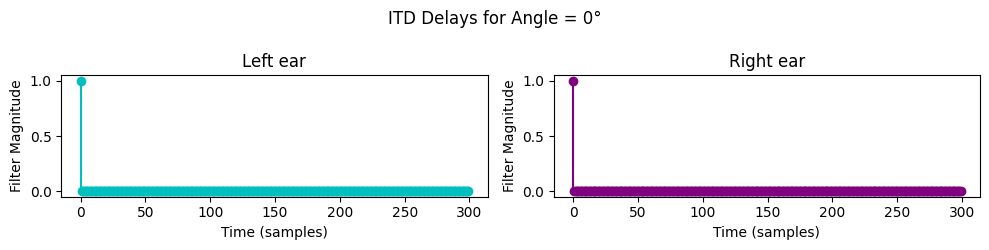

sound (straight ahead)


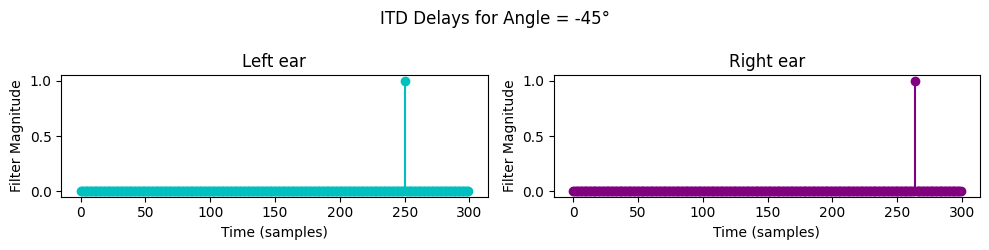

sound (45 degrees to left)


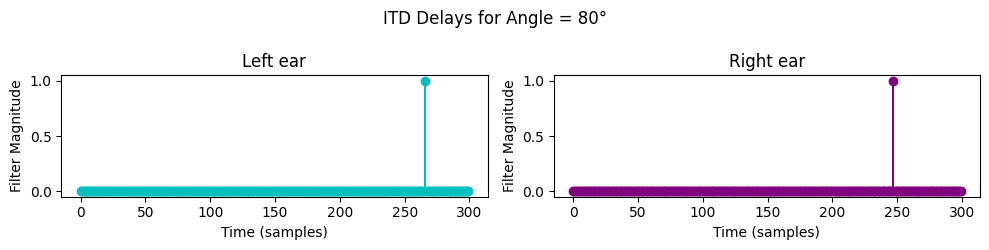

sound (80 degrees to right)


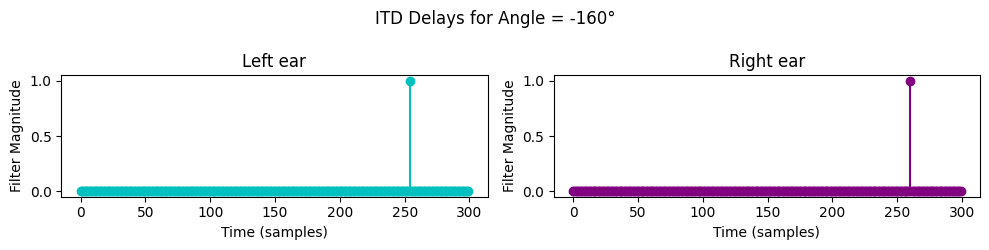

sound (160 degrees to left)


In [86]:
# YOUR CODE HERE

# using https://courses.physics.illinois.edu/phys406/sp2017/Lecture_Notes/P406POM_Lecture_Notes/P406POM_Lect5.pdf for 0.15m head distance
# sound_sr, sound_x = utils.wavreadurl("https://drive.google.com/uc?export=download&id=1bsZArYwMftsuCLdMknRomz4kAJWT-Uhv") # paper
# sound_sr, sound_x = utils.wavreadurl("https://drive.google.com/uc?export=download&id=1bswUsI28yJOUQuNLvNxq3pu9qj0bb8ne") # fly
sound_sr, sound_x = utils.wavreadurl("https://drive.google.com/uc?export=download&id=1c8YhNNLmaO7CA2dJNCkBsB9MY0HjHDRL") # helicopter
utils.sound(sound_x, sound_sr, "sound (original)")

# straight ahead (zero delay)
delayed_0 = simulate_source_delay(sound_x, sound_sr, 0)
utils.sound(delayed_0, sound_sr, "sound (straight ahead)")

# 45 degrees to the left
delayed_45 = simulate_source_delay(sound_x, sound_sr, -45)
utils.sound(delayed_45, sound_sr, "sound (45 degrees to left)")

# 80 degrees to the right
delayed_80 = simulate_source_delay(sound_x, sound_sr, 80)
utils.sound(delayed_80, sound_sr, "sound (80 degrees to right)")

# 160 degrees to the left
delayed_160 = simulate_source_delay(sound_x, sound_sr, -160)
utils.sound(delayed_160, sound_sr, "sound (160 degrees to left)")

## Part 2. Static sources using HRTFs

Download the HTTF archive from [https://drive.google.com/uc?export=download&id=1vFzSo-zlNFI-q2T9yvRRmOeZ-elZ8lW3 ]. In that directory you will also find code for the function load_hrtf which returns the left and right HRTF filters given as input a source’s azimuth and elevation. These filters will be much better than the ITD/ILD filters for localizing sounds.

Apply the HRTFs on the given sources and create 3D sounds that correspond to the locations given above. For each source, you will need to convolve it with the left and right HRTF of the desired position and generate two sounds, one for each channel. Verify that they sound correct using headphones; are they better than before? What differences do you observe? When you use these make sure that the sample rates of the HRTFs and the sounds you convolve them with match.  The HRTFs are sampled at 44.1kHz.

Once again, just render one example before submission (the same as before so that we can compare).

In [87]:
from hrtf.load_hrtf import load_hrtf

In [88]:
# YOUR CODE HERE
def hrtf_static_source(input_x, sample_rate, azimuth, elevation):
    # load the HRTF
    left_ear, right_ear = load_hrtf(azimuth, elevation)
    
    # convolve the left and right channels with the sound
    left_channel = np.convolve(input_x, left_ear)
    right_channel = np.convolve(input_x, right_ear)

    # stack the channels and play the sound
    hrtf_sound = np.stack((left_channel, right_channel), axis=0)
    utils.sound(hrtf_sound, sample_rate, f"sound (using HRTF azimuth={azimuth} and elevation={elevation})")

# play HRTFs for different azimuth angles
hrtf_static_source(sound_x, sound_sr, 0, 0)
hrtf_static_source(sound_x, sound_sr, 90, 0)
hrtf_static_source(sound_x, sound_sr, 180, 0)
hrtf_static_source(sound_x, sound_sr, 270, 0)

# play HRTFs for different elevations
hrtf_static_source(sound_x, sound_sr, 0, -40)
hrtf_static_source(sound_x, sound_sr, 0, 50)

sound (using HRTF azimuth=0 and elevation=0)


sound (using HRTF azimuth=90 and elevation=0)


sound (using HRTF azimuth=180 and elevation=0)


sound (using HRTF azimuth=270 and elevation=0)


sound (using HRTF azimuth=0 and elevation=-40)


sound (using HRTF azimuth=0 and elevation=50)


My thoughts: Using the HRTFs to create static sources sounded similar to the ones previously made using ITD/ILD but had slightly more clear source directions. They also sound a bit more natural in terms of feeling like they are coming from a certain direction. I also found it easier to hear the differences in changing the azimuth angle more than the elevation angle.  

## Part 3. Dynamic Sources with HRTFs

In this part you will need to make a moving sound source. In order to do so we will make use of a fast convolution routine based on your STFT code from lab 1 (*ha, you thought you were done with that!*). In order to perform fast convolution we can perform an STFT of the sound to use, multiply each time frame of this transform with the DFT of the filter that we want  to impose and then use overlap add to transform back to the time domain.

Start by taking each sound from above, and apply your STFT on it. Make sure that the size of the transform is the same as the HRTF’s filter length. The hop size should be the same as the DFT size and you will need to zero pad each frame by as much as the DFT size in order to facilitate the tail of the convolution. Do not use an analysis/synthesis window.  Also zero pad the HRTF filters and take their DFT, so that you end up with an array which is the same size as each frame of the STFT.

Once you compute this STFT, go through its every time frame and element-wise multiply it with the desired HRTF filter to generate the STFT of the left and right sounds. Figure out which HRTF angle to multiply each frame with so that by the end of the sound you will have made it go around your head.

Once you perform these operations you will have generated two STFT matrices, one for the left channel and one for the right. Use your inverse STFT routine and play the stereo sound through your headphones. You should hear a convincing rendering of the original sounds circling around your head.

**Submit only one of the sounds, but make sure you try it on all and that it sounds ok.**

In [91]:
# Convert input sound to time/frequency domain for spectrogram plotting
def stft(input_sound, dft_size, hop_size, window=None, padding=0):
    # get windowed segments of input sound and compute DFT of each
    spectrogram = []
    n = len(input_sound)

    for i in range(0, n - dft_size - 1, hop_size):
        #  get frame, padding with zeros if necessary
        frame = []
        if i + dft_size < n:
            frame = input_sound[i:i+dft_size]
        else:
            frame = np.append(input_sound[i:n], np.zeros((i + dft_size) - n))

        # apply window if not None
        if window is not None:
            frame = frame * window
            
        # compute DFT (padding not 0 if using HRTF)
        frame_dft = np.fft.rfft(frame, n=(dft_size + padding))

        # append to spectrogram array
        spectrogram.append(frame_dft) # append as rows

    # Return a complex-valued spectrogram (frequencies x time)
    return np.array(spectrogram).T

def istft(stft_output, dft_size, hop_size, window=None, padding=0):
    num_frames = np.shape(stft_output)[1]
    n = dft_size + ((num_frames - 1) * hop_size) + padding
    output_sound = np.zeros(n)

    for i in range(num_frames):
        # compute inverse FFT for current frame
        frame_idft = np.fft.irfft(stft_output[:,i])

        # apply window if not None
        frame = frame_idft
        if window is not None:
            frame = frame * np.sqrt(window)

        # add result to output_sound at correct indices
        start_idx = i * hop_size
        output_sound[start_idx : start_idx + dft_size + padding] += frame
    
    # Return reconstructed waveform
    return output_sound

In [95]:
# YOUR CODE HERE
dft_size = 128
sound_stft = stft(sound_x, dft_size, dft_size, None, dft_size)
num_frames = np.shape(sound_stft)[1]

left_stft = np.zeros_like(sound_stft)
right_stft = np.zeros_like(sound_stft)

azimuth = 0
elevation = 0
for i in range(num_frames):
    # get current frame of input sound's stft
    frame = sound_stft[:, i]
    
    # load the HRTF
    azimuth += (360 / num_frames)
    left_ear, right_ear = load_hrtf(azimuth, elevation)

    # DFT the left and right HRTFs
    dft_hrtf_left = np.fft.rfft(left_ear, n=(dft_size*2))
    dft_hrtf_right = np.fft.rfft(right_ear, n=(dft_size*2))

    # element-wise multiply the frame with the HRTF filters
    left = frame * dft_hrtf_left
    right = frame * dft_hrtf_right

    # update channels
    if i == 0:
        left_stft[:, i] = left
        right_stft[:, i] = right
    else:
        left_stft[:, i] = 0.12 * left_stft[:, i-1] + 0.88 * left
        right_stft[:, i] = 0.12 * right_stft[:, i-1] + 0.88 * right

# compute inverse STFTs to get the left and right channels
left_channel = istft(left_stft, dft_size, dft_size, None, dft_size)
right_channel = istft(right_stft, dft_size, dft_size, None, dft_size)

# stack left and right channels and play sound
dynamic_sound = np.stack((left_channel, right_channel), axis=0)
utils.sound(dynamic_sound, sound_sr, "sound (using dynamic HRTF angles)")

sound (using dynamic HRTF angles)


## Part 4. Extra credit (required for 4-hour credit registrants)

Use the file in [https://drive.google.com/uc?export=download&id=1bxQkXcGa57S3G7IRWu9urS-jCPdf5Pif ] to make a short story. This is a 7-channel file of a scene from a really bad B-movie. Each channel contains a different sound. If you play that sound you probably won’t hear most of the content since you won’t have a 7 speaker setup, import it in a multi-channel editor such as Audacity and you will get a sense of what’s in there. Since it sounds so boring you need to add some reverb and 3D-locate the sounds so that it sounds more exciting. Try to make it sound better using what we have done so far. Keep in mind that you can add different amounts of reverb for each sound, and you can dynamically 3D place them as well.

In [ ]:
# YOUR CODE HERE
raise NotImplementedError()